In [1]:
import matplotlib.pyplot as plt
import numpy as np
import datetime
import pandas as pd
import xarray as xr
import netCDF4
import simulake

In [157]:
#lac du chambon, reservoir parallélépipédique

In [158]:
df_C = pd.read_csv('level_Chambon.csv').set_index("date")
df_C.index = pd.to_datetime(df_C.index)

prodCentrales = pd.read_parquet("2010-01-01_2100-01-01_hydro_10min.parquet")

apports = pd.read_csv("debit-des-rivieres-aux-abords-de-centrales-hydrauliques-depuis-2001.csv")
apports = apports[apports["Périmètre spatial"] ==	"Débit naturel journalier de la Romanche à Chambon Amont (220km2) Q0105"].copy()
apports['Date'] = pd.to_datetime(apports['Date'])
apports.index = apports['Date']

In [159]:
forcing = simulake.build_reservoir_forcings(df_C, prodCentrales, apports, "level", "SSGUIH", "Débit", 1/116*45, freq='1h')

In [160]:
## courbe h-s-V parallélépipédique

pd.DataFrame({
    "h": [980, 1040],
    "s": [800000, 800000],
    "v": [0, 48000000]
}).to_csv("rating_curve_Chambon.csv", index=False)

r_curve = simulake.RatingCurve.from_csv("rating_curve_Chambon.csv", "h", "s", "v")

In [2]:
def h_s_v_power_law(h, a, b):
    s = a * h**1.42
    v = b * h**2.42
    return s, v

In [ ]:
## courbe h-s-V loi de puissance

h_list = np.arange(980, 1040, 1)

a_coeff = 1400000 / (1040 - 980)**1.42
b_coeff = 48000000 / (1040 - 980)**2.42

s_list_pl, v_list_pl = h_s_v_power_law(h_list - 980, a_coeff, b_coeff)

pd.DataFrame({
    "h": h_list,
    "s": s_list_pl,
    "v": v_list_pl
}).to_csv("rating_curve_Chambon_power_law.csv", index=False)

r_curve_power_law = simulake.RatingCurve.from_csv("rating_curve_Chambon_power_law.csv", "h", "s", "v")

In [162]:
## courbe h-s-V en pyramide inversée

def h_s_v_inverted_pyramid(h, h_tot, v_tot):
    v = v_tot * (h / h_tot)**3
    s = 3 * v_tot / h_tot * (h / h_tot)**2
    return s, v

s_list_ip, v_list_ip = h_s_v_inverted_pyramid(h_list - 980, 60, 48000000)

pd.DataFrame({
    "h": h_list,
    "s": s_list_ip,
    "v": v_list_ip
}).to_csv("rating_curve_Chambon_inverted_pyramid.csv", index=False)

r_curve_inverted_pyramid = simulake.RatingCurve.from_csv("rating_curve_Chambon_inverted_pyramid.csv", "h", "s", "v")

In [163]:
assimilator = simulake.EnKFParamsReservoir(200, 0.2, 1, 50, 0, 48000000)
print(assimilator.__str__())

results = simulake.run_reservoir_enkf_enks(forcing,r_curve, assimilator)

EnKFParamsReservoir(N=200, sigma_obs=0.2, sigma_init=1, sigma_eta=50, Vmin=0, Vmax=48000000)


Text(0, 0.5, 'Débit (m3/s)')

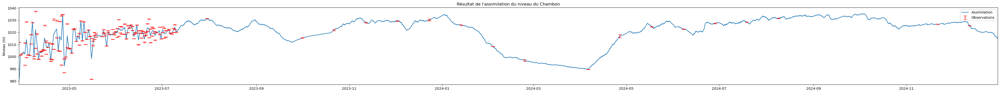

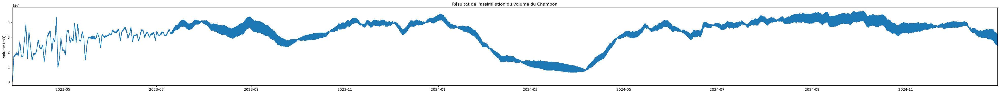

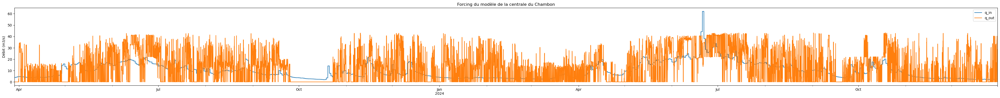

In [164]:
plt.figure(figsize = (50,4))
plt.plot(results["H_mean_smoothed"]['H_mean_smoothed'], label = "Assimilation")
plt.errorbar(df_C.index, df_C['level'], yerr = df_C['uncert'], color = "red", label = "Observations", ls = "none", capsize = 5)
plt.title("Résultat de l'assimilation du niveau du Chambon")
plt.ylabel("Niveau (m)")
plt.xlim(results["H_mean_smoothed"].index.min(), results["H_mean_smoothed"].index.max())
plt.legend()

plt.figure(figsize = (50,4))
plt.errorbar(results["V_mean_smoothed"].index, results["V_mean_smoothed"]['V_mean_smoothed'], results["V_std_smoothed"]['V_std_smoothed'])
plt.title("Résultat de l'assimilation du volume du Chambon")
plt.ylabel("Volume (m3)")
plt.xlim(results["V_mean_smoothed"].index.min(), results["V_mean_smoothed"].index.max())

plt.figure(figsize = (50,4))
forcing['q_in'].plot()
forcing['q_out'].plot()
plt.legend()
plt.title("Forcing du modèle de la centrale du Chambon")
plt.ylabel("Débit (m3/s)")

c:\Users\paoliniart\AppData\Local\miniconda3\envs\tests\Lib\site-packages\pandas\plotting\_matplotlib\core.py:997: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  return ax.plot(*args, **kwds)


Text(0, 0.5, 'Débit (m3/s)')

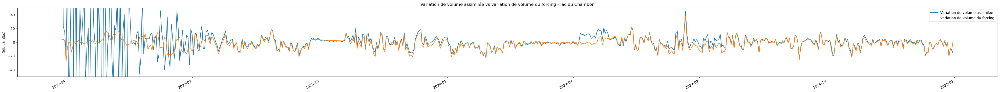

In [165]:
plt.figure(figsize = (50,4))
plt.plot(pd.Series((np.array(results["V_mean_smoothed"]["V_mean_smoothed"])[1:] - np.array(results["V_mean_smoothed"]["V_mean_smoothed"])[:-1])/3600,
                   index = results["V_mean_smoothed"].index[1:]).resample('1D').mean())
(forcing["q_in"] - forcing["q_out"]).resample('D').mean().plot()
plt.ylim(-50, 50)
plt.legend(["Variation de volume assimilée", "Variation de volume du forcing"])
plt.title("Variation de volume assimilée vs variation de volume du forcing - lac du Chambon")
plt.ylabel("Débit (m3/s)")

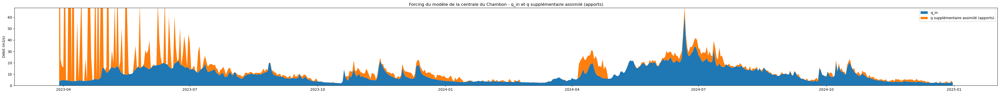

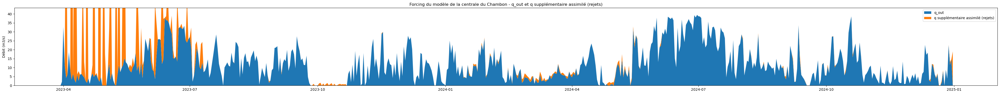

In [166]:
plt.figure(figsize = (50,4))
plt.stackplot(forcing["q_in"].resample('D').mean().index,[list((forcing["q_in"]).resample('D').mean()),
                    np.maximum(pd.Series((np.array(results["V_mean_smoothed"]["V_mean_smoothed"])[1:] - np.array(results["V_mean_smoothed"]["V_mean_smoothed"])[:-1])/3600,
                   index = results["V_mean_smoothed"].index[1:]).resample('1D').mean() - (forcing["q_in"] - forcing["q_out"]).resample('D').mean(), 0)])
plt.ylim(0, forcing["q_in"].resample('D').mean().max() * 1.1)
plt.legend(["q_in", "q supplémentaire assimilé (apports)"])
plt.title("Forcing du modèle de la centrale du Chambon - q_in et q supplémentaire assimilé (apports)")
plt.ylabel("Débit (m3/s)")

plt.figure(figsize = (50,4))
plt.stackplot(forcing["q_out"].resample('D').mean().index,[list((forcing["q_out"]).resample('D').mean()),
                    np.maximum(-pd.Series((np.array(results["V_mean_smoothed"]["V_mean_smoothed"])[1:] - np.array(results["V_mean_smoothed"]["V_mean_smoothed"])[:-1])/3600,
                   index = results["V_mean_smoothed"].index[1:]).resample('1D').mean() + (forcing["q_in"] - forcing["q_out"]).resample('D').mean(), 0)])
plt.ylim(0, forcing["q_out"].resample('D').mean().max() * 1.1)
plt.legend(["q_out", "q supplémentaire assimilé (rejets)"])
plt.title("Forcing du modèle de la centrale du Chambon - q_out et q supplémentaire assimilé (rejets)")
plt.ylabel("Débit (m3/s)")

q_in_supp_piscine = np.maximum(pd.Series((np.array(results["V_mean_smoothed"]["V_mean_smoothed"])[1:] - np.array(results["V_mean_smoothed"]["V_mean_smoothed"])[:-1])/3600,
                   index = results["V_mean_smoothed"].index[1:]).resample('1D').mean() - (forcing["q_in"] - forcing["q_out"]).resample('D').mean(), 0)

q_in_supp_piscine = q_in_supp_piscine / (q_in_supp_piscine + forcing["q_in"].resample('D').mean())

q_out_supp_piscine = np.maximum(-pd.Series((np.array(results["V_mean_smoothed"]["V_mean_smoothed"])[1:] - np.array(results["V_mean_smoothed"]["V_mean_smoothed"])[:-1])/3600,
                   index = results["V_mean_smoothed"].index[1:]).resample('1D').mean() + (forcing["q_in"] - forcing["q_out"]).resample('D').mean(), 0)

q_out_supp_piscine = q_out_supp_piscine / (q_out_supp_piscine + forcing["q_out"].resample('D').mean() + 1e-6)

Text(0, 0.5, 'Débit (m3/s)')

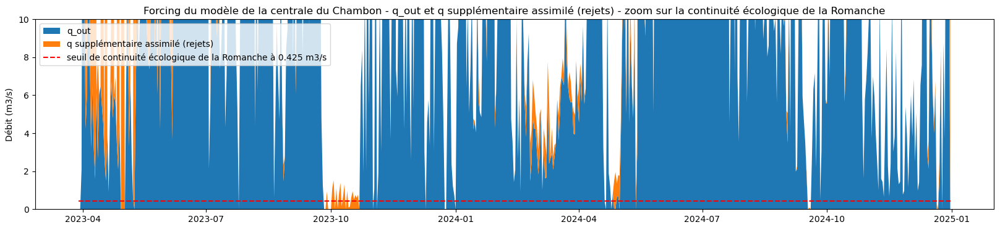

In [167]:
## zoom sur la continuité écologique de la romanche

plt.figure(figsize = (20,4))
plt.stackplot(forcing["q_out"].resample('D').mean().index,[list((forcing["q_out"]).resample('D').mean()),
                    np.maximum(-pd.Series((np.array(results["V_mean_smoothed"]["V_mean_smoothed"])[1:] - np.array(results["V_mean_smoothed"]["V_mean_smoothed"])[:-1])/3600,
                   index = results["V_mean_smoothed"].index[1:]).resample('1D').mean() + (forcing["q_in"] - forcing["q_out"]).resample('D').mean(), 0)],
                    labels = ["q_out", "q supplémentaire assimilé (rejets)"])
plt.plot(forcing["q_out"].resample('D').mean().index, [0.425]* len(forcing["q_out"].resample('D').mean()), label = "seuil de continuité écologique de la Romanche à 0.425 m3/s",
         color = "red", ls = "--")
plt.ylim(0, 10)
plt.legend()
plt.title("Forcing du modèle de la centrale du Chambon - q_out et q supplémentaire assimilé (rejets) - zoom sur la continuité écologique de la Romanche")
plt.ylabel("Débit (m3/s)")


In [168]:
## meme chose avec la courbe h-s-v en loi de puissance

In [169]:
assimilator = simulake.EnKFParamsReservoir(200, 0.2, 1, 50, 0, 48000000)
print(assimilator.__str__())

results_power_law = simulake.run_reservoir_enkf_enks(forcing,r_curve_power_law, assimilator)

EnKFParamsReservoir(N=200, sigma_obs=0.2, sigma_init=1, sigma_eta=50, Vmin=0, Vmax=48000000)


Text(0, 0.5, 'Débit (m3/s)')

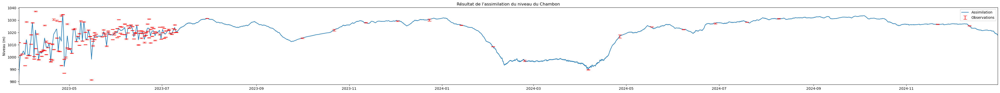

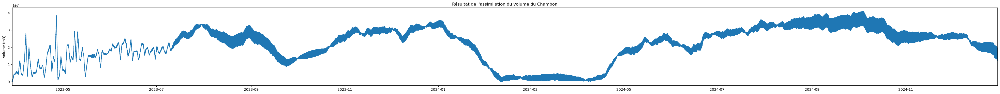

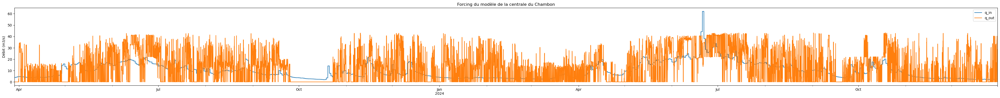

In [170]:
plt.figure(figsize = (50,4))
plt.plot(results_power_law["H_mean_smoothed"]['H_mean_smoothed'], label = "Assimilation")
plt.errorbar(df_C.index, df_C['level'], yerr = df_C['uncert'], color = "red", label = "Observations", ls = "none", capsize = 5)
plt.title("Résultat de l'assimilation du niveau du Chambon")
plt.ylabel("Niveau (m)")
plt.xlim(results_power_law["H_mean_smoothed"].index.min(), results_power_law["H_mean_smoothed"].index.max())
plt.legend()

plt.figure(figsize = (50,4))
plt.errorbar(results_power_law["V_mean_smoothed"].index, results_power_law["V_mean_smoothed"]['V_mean_smoothed'], results_power_law["V_std_smoothed"]['V_std_smoothed'])
plt.title("Résultat de l'assimilation du volume du Chambon")
plt.ylabel("Volume (m3)")
plt.xlim(results_power_law["V_mean_smoothed"].index.min(), results_power_law["V_mean_smoothed"].index.max())

plt.figure(figsize = (50,4))
forcing['q_in'].plot()
forcing['q_out'].plot()
plt.legend()
plt.title("Forcing du modèle de la centrale du Chambon")
plt.ylabel("Débit (m3/s)")

c:\Users\paoliniart\AppData\Local\miniconda3\envs\tests\Lib\site-packages\pandas\plotting\_matplotlib\core.py:997: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  return ax.plot(*args, **kwds)


Text(0, 0.5, 'Débit (m3/s)')

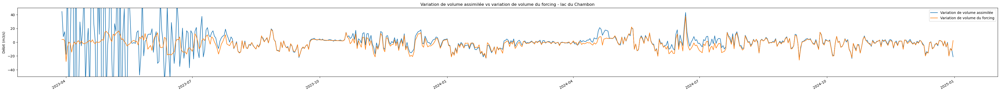

In [171]:
plt.figure(figsize = (50,4))
plt.plot(pd.Series((np.array(results_power_law["V_mean_smoothed"]["V_mean_smoothed"])[1:] - np.array(results_power_law["V_mean_smoothed"]["V_mean_smoothed"])[:-1])/3600,
                   index = results_power_law["V_mean_smoothed"].index[1:]).resample('1D').mean())
(forcing["q_in"] - forcing["q_out"]).resample('D').mean().plot()
plt.ylim(-50, 50)
plt.legend(["Variation de volume assimilée", "Variation de volume du forcing"])
plt.title("Variation de volume assimilée vs variation de volume du forcing - lac du Chambon")
plt.ylabel("Débit (m3/s)")

In [172]:
q_in_supp_power = np.maximum(pd.Series((np.array(results_power_law["V_mean_smoothed"]["V_mean_smoothed"])[1:] - np.array(results_power_law["V_mean_smoothed"]["V_mean_smoothed"])[:-1])/3600,
                   index = results_power_law["V_mean_smoothed"].index[1:]).resample('1D').mean() - (forcing["q_in"] - forcing["q_out"]).resample('D').mean(), 0)

q_in_supp_power = q_in_supp_power / (q_in_supp_power + forcing["q_in"].resample('D').mean())

q_out_supp_power = np.maximum(-pd.Series((np.array(results_power_law["V_mean_smoothed"]["V_mean_smoothed"])[1:] - np.array(results_power_law["V_mean_smoothed"]["V_mean_smoothed"])[:-1])/3600,
                   index = results_power_law["V_mean_smoothed"].index[1:]).resample('1D').mean() + (forcing["q_in"] - forcing["q_out"]).resample('D').mean(), 0)

q_out_supp_power = q_out_supp_power / (q_out_supp_power + forcing["q_out"].resample('D').mean() + 1e-6)

Text(0, 0.5, 'Proportion de q_out assimilé')

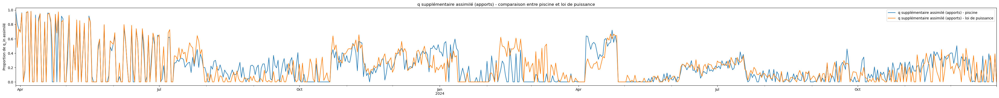

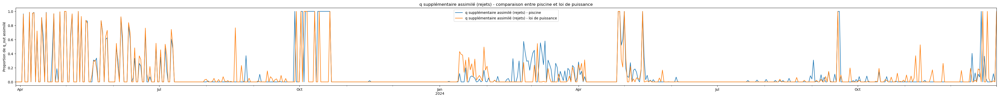

In [173]:
plt.figure(figsize = (50,4))
q_in_supp_piscine.plot(label = "q supplémentaire assimilé (apports) - piscine")
q_in_supp_power.plot(label = "q supplémentaire assimilé (apports) - loi de puissance")
plt.legend()
plt.title("q supplémentaire assimilé (apports) - comparaison entre piscine et loi de puissance")
plt.ylabel("Proportion de q_in assimilé")

plt.figure(figsize = (50,4))
q_out_supp_piscine.plot(label = "q supplémentaire assimilé (rejets) - piscine")
q_out_supp_power.plot(label = "q supplémentaire assimilé (rejets) - loi de puissance")
plt.legend() 
plt.title("q supplémentaire assimilé (rejets) - comparaison entre piscine et loi de puissance")
plt.ylabel("Proportion de q_out assimilé")



In [174]:
## comparaison entre les deux courbes h-s-v (+ la courbe en pyramide inversée)

In [175]:
assimilator = simulake.EnKFParamsReservoir(200, 0.2, 1, 50, 0, 48000000)
print(assimilator.__str__())

results_inverted_pyramid = simulake.run_reservoir_enkf_enks(forcing,r_curve_inverted_pyramid, assimilator)

EnKFParamsReservoir(N=200, sigma_obs=0.2, sigma_init=1, sigma_eta=50, Vmin=0, Vmax=48000000)


(np.float64(19445.0), np.float64(20088.0))

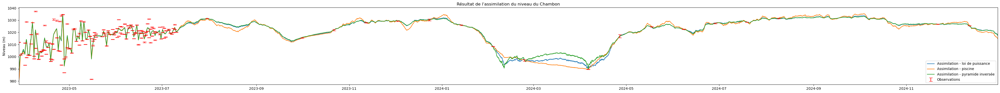

c:\Users\paoliniart\AppData\Local\miniconda3\envs\tests\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


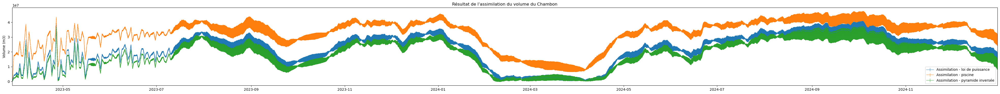

In [176]:
plt.figure(figsize = (50,4))
plt.plot(results_power_law["H_mean_smoothed"]['H_mean_smoothed'], label = "Assimilation - loi de puissance")
plt.plot(results["H_mean_smoothed"]['H_mean_smoothed'], label = "Assimilation - piscine")
plt.plot(results_inverted_pyramid["H_mean_smoothed"]['H_mean_smoothed'], label = "Assimilation - pyramide inversée")
plt.errorbar(df_C.index, df_C['level'], yerr = df_C['uncert'], color = "red", label = "Observations", ls = "none", capsize = 5)
plt.title("Résultat de l'assimilation du niveau du Chambon")
plt.ylabel("Niveau (m)")
plt.xlim(results_power_law["H_mean_smoothed"].index.min(), results_power_law["H_mean_smoothed"].index.max())
plt.legend()

plt.figure(figsize = (50,4))
plt.errorbar(results_power_law["V_mean_smoothed"].index, results_power_law["V_mean_smoothed"]['V_mean_smoothed'], results_power_law["V_std_smoothed"]['V_std_smoothed'], alpha = 0.5, label = "Assimilation - loi de puissance")
plt.errorbar(results["V_mean_smoothed"].index, results["V_mean_smoothed"]['V_mean_smoothed'], results["V_std_smoothed"]['V_std_smoothed'], alpha = 0.5, label = "Assimilation - piscine")
plt.errorbar(results_inverted_pyramid["V_mean_smoothed"].index, results_inverted_pyramid["V_mean_smoothed"]['V_mean_smoothed'], results_inverted_pyramid["V_std_smoothed"]['V_std_smoothed'], alpha = 0.5, label = "Assimilation - pyramide inversée")
plt.legend()
plt.title("Résultat de l'assimilation du volume du Chambon")
plt.ylabel("Volume (m3)")
plt.xlim(results_power_law["V_mean_smoothed"].index.min(), results_power_law["V_mean_smoothed"].index.max())

Text(0, 0.5, 'Surface (m2)')

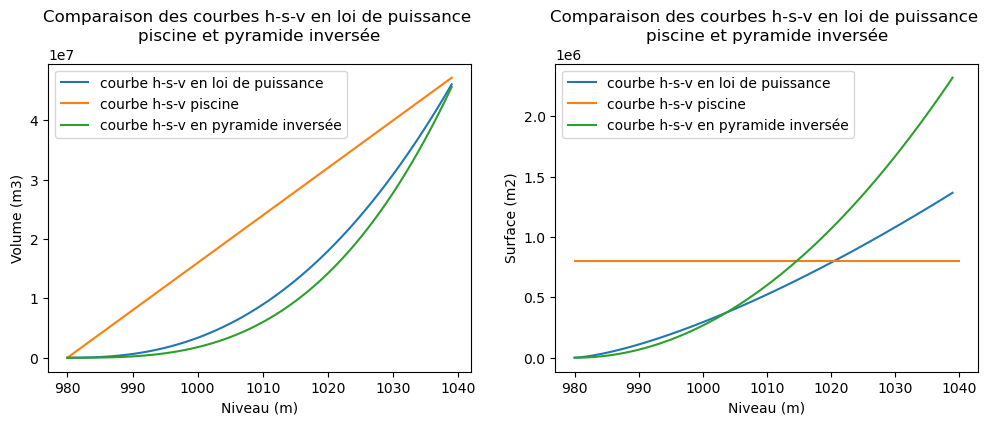

In [177]:
fig, ax = plt.subplots(1, 2, figsize = (12, 4))
ax[0].plot(h_list, v_list_pl, label = "courbe h-s-v en loi de puissance")
ax[0].plot(h_list, (h_list - 980) * 800000, label = "courbe h-s-v piscine")
ax[0].plot(h_list, v_list_ip, label = "courbe h-s-v en pyramide inversée")
ax[0].legend()
ax[0].set_title("Comparaison des courbes h-s-v en loi de puissance \npiscine et pyramide inversée")
ax[0].set_xlabel("Niveau (m)")
ax[0].set_ylabel("Volume (m3)")
ax[1].plot(h_list, s_list_pl, label = "courbe h-s-v en loi de puissance")
ax[1].plot([980, 1040], [800000, 800000], label = "courbe h-s-v piscine")
ax[1].plot(h_list, s_list_ip, label = "courbe h-s-v en pyramide inversée")
ax[1].legend()
ax[1].set_title("Comparaison des courbes h-s-v en loi de puissance \npiscine et pyramide inversée")
ax[1].set_xlabel("Niveau (m)")
ax[1].set_ylabel("Surface (m2)")

In [21]:
#step de grand maison, reservoir parallélépipédique, apports au Verney (la centrale du Verney n'est pas modélisée)

In [22]:
df_GM = pd.read_csv('level_Grand_Maison.csv').set_index("date")
df_GM.index = pd.to_datetime(df_GM.index)
df_GM = df_GM.rename(columns = {"level" : "level_GM", "uncert" : "uncert_GM"})
df_V = pd.read_csv('level_Verney.csv').set_index("date")
df_V.index = pd.to_datetime(df_V.index)
df_V = df_V.rename(columns = {"level" : "level_V", "uncert" : "uncert_V"})


prodCentrales = pd.read_parquet("2010-01-01_2100-01-01_hydro_10min.parquet")

apports = pd.read_csv("debit-des-rivieres-aux-abords-de-centrales-hydrauliques-depuis-2001.csv")

apports = apports[apports["Périmètre spatial"] ==	"Débit naturel reconstitué journalier de l'Eau d'Olle à la Pernière (172km2) Q0115"].copy()
apports['Date'] = pd.to_datetime(apports['Date'])
apports.index = apports['Date']
apports = apports.rename(columns= {"Débit" : "debit_V"})
apports['debit_GM'] = 0

pump = pd.read_parquet("2010-01-01_2100-01-01_hydro_10min_soutirage.parquet")

In [23]:
forcing = simulake.build_step_forcings(pd.concat([df_GM, df_V], axis = 1), prodCentrales, pump, apports, "level_GM", "level_V", "G.MAIH", "OZ   H",
                                       "G.MAIHP", "debit_GM", "debit_V", 1/1690*216, 1/12.2*32, 1/1280*128, freq='1h')

In [24]:
#courbe h-s-V parallélépipédique

pd.DataFrame({
    "h": [1590, 1695],
    "s": [1257143, 1257143],
    "v": [0, 132000000]
}).to_csv("rating_curve_Grand_Maison.csv", index=False)

pd.DataFrame({
    "h": [740, 768.5],
    "s": [501754, 501754],
    "v": [0, 14300000]
}).to_csv("rating_curve_Verney.csv", index=False)

r_curve_amt = simulake.RatingCurve.from_csv("rating_curve_Grand_Maison.csv", "h", "s", "v")

r_curve_avl = simulake.RatingCurve.from_csv("rating_curve_Verney.csv", "h", "s", "v")

In [25]:
## courbe h-s-V en loi de puissance

h_list = np.arange(1590, 1695, 1)

a_coeff = 2190000 / (1695 - 1590)**1.42
b_coeff = 132000000 / (1695 - 1590)**2.42

s_list, v_list = h_s_v_power_law(h_list - 1590, a_coeff, b_coeff)

pd.DataFrame({
    "h": h_list,
    "s": s_list,
    "v": v_list
}).to_csv("rating_curve_Grand_Maison_power_law.csv", index=False)

r_curve_power_law_amt = simulake.RatingCurve.from_csv("rating_curve_Grand_Maison_power_law.csv", "h", "s", "v")

h_list = np.arange(740, 768.5, 1)

a_coeff = 750000 / (768.5 - 740)**1.42
b_coeff = 14300000 / (768.5 - 740)**2.42

s_list, v_list = h_s_v_power_law(h_list - 740, a_coeff, b_coeff)

pd.DataFrame({
    "h": h_list,
    "s": s_list,
    "v": v_list
}).to_csv("rating_curve_Verney_power_law.csv", index=False)

r_curve_power_law_avl = simulake.RatingCurve.from_csv("rating_curve_Verney_power_law.csv", "h", "s", "v")

In [26]:
assimilator = simulake.EnKFParamsStep(200, 0.2, 1, 10, 50, 90, 0, 135000000, 0, 14300000)
print(assimilator.__str__())

results = simulake.run_step_enkf_enks(forcing,r_curve_amt, r_curve_avl, assimilator)

EnKFParamsStep(N=200, sigma_obs=0.2, sigma_init=1, sigma_eta_step=10, sigma_eta_app=50, sigma_eta_out=90, Vmin_amt=0, Vmax_amt=135000000, Vmin_avl=0, Vmax_avl=14300000)


Text(0, 0.5, 'Débit (m3/s)')

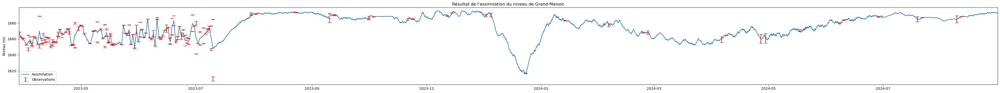

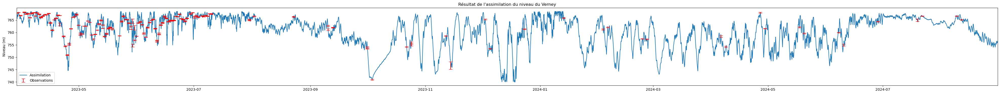

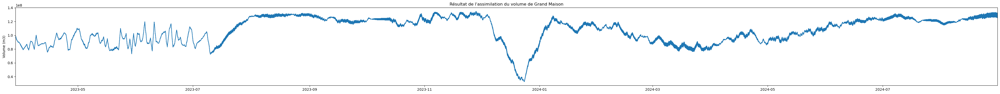

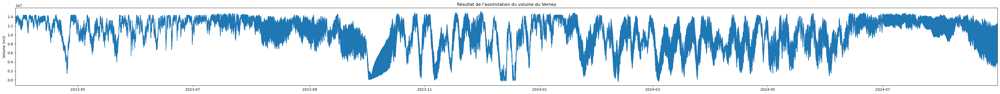

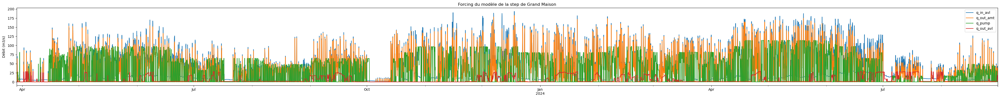

In [27]:
plt.figure(figsize = (50,4))
plt.plot(results["H_mean_smoothed"]['H_mean_smoothed_amt'], label = "Assimilation")
plt.errorbar(df_GM.index, df_GM['level_GM'], yerr = df_GM['uncert_GM'], color = "red", label = "Observations", ls = "none", capsize = 5)
plt.title("Résultat de l'assimilation du niveau de Grand Maison")
plt.ylabel("Niveau (m)")
plt.xlim(results["H_mean_smoothed"].index.min(), results["H_mean_smoothed"].index.max())
plt.legend()

plt.figure(figsize = (50,4))
plt.plot(results["H_mean_smoothed"]['H_mean_smoothed_avl'], label = "Assimilation")
plt.errorbar(df_V.index, df_V['level_V'], yerr = df_V['uncert_V'], color = "red", label = "Observations", ls = "none", capsize = 5)
plt.title("Résultat de l'assimilation du niveau du Verney")
plt.ylabel("Niveau (m)")
plt.xlim(results["H_mean_smoothed"].index.min(), results["H_mean_smoothed"].index.max())
plt.legend()

plt.figure(figsize = (50,4))
plt.errorbar(results["V_mean_smoothed"].index, results["V_mean_smoothed"]['V_mean_smoothed_amt'], results["V_std_smoothed"]['V_std_smoothed_amt'])
plt.title("Résultat de l'assimilation du volume de Grand Maison")
plt.ylabel("Volume (m3)")
plt.xlim(results["V_mean_smoothed"].index.min(), results["V_mean_smoothed"].index.max())

plt.figure(figsize = (50,4))
plt.errorbar(results["V_mean_smoothed"].index, results["V_mean_smoothed"]['V_mean_smoothed_avl'], results["V_std_smoothed"]['V_std_smoothed_avl'])
plt.title("Résultat de l'assimilation du volume du Verney")
plt.ylabel("Volume (m3)")
plt.xlim(results["V_mean_smoothed"].index.min(), results["V_mean_smoothed"].index.max())

plt.figure(figsize = (50, 4))
forcing["q_in_avl"].plot()
forcing["q_out_amt"].plot()
forcing["q_pump"].plot()
forcing["q_out_avl"].plot()

plt.legend()
plt.title("Forcing du modèle de la step de Grand Maison")
plt.ylabel("Débit (m3/s)")

c:\Users\paoliniart\AppData\Local\miniconda3\envs\tests\Lib\site-packages\pandas\plotting\_matplotlib\core.py:997: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  return ax.plot(*args, **kwds)
c:\Users\paoliniart\AppData\Local\miniconda3\envs\tests\Lib\site-packages\pandas\plotting\_matplotlib\core.py:997: UserWarning: This axis already has a converter set and is updating to a potentially incompatible converter
  return ax.plot(*args, **kwds)


Text(0, 0.5, 'Débit (m3/s)')

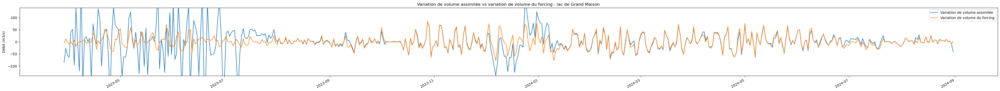

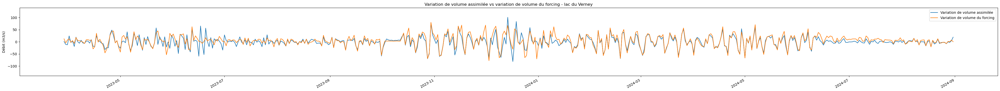

In [28]:
plt.figure(figsize = (50,4))
plt.plot(pd.Series((np.array(results["V_mean_smoothed"]["V_mean_smoothed_amt"])[1:] - np.array(results["V_mean_smoothed"]["V_mean_smoothed_amt"])[:-1])/3600,
                   index = results["V_mean_smoothed"].index[1:]).resample('1D').mean())
(forcing["q_pump"] - forcing["q_out_amt"]).resample('D').mean().plot()
plt.ylim(-140, 140)
plt.legend(["Variation de volume assimilée", "Variation de volume du forcing"])
plt.title("Variation de volume assimilée vs variation de volume du forcing - lac de Grand Maison")
plt.ylabel("Débit (m3/s)")

plt.figure(figsize = (50,4))
plt.plot(pd.Series((np.array(results["V_mean_smoothed"]["V_mean_smoothed_avl"])[1:] - np.array(results["V_mean_smoothed"]["V_mean_smoothed_avl"])[:-1])/3600,
                   index = results["V_mean_smoothed"].index[1:]).resample('1D').mean())
(forcing["q_in_avl"] - forcing["q_out_avl"] - forcing["q_pump"]).resample('D').mean().plot()
plt.ylim(-140, 140)
plt.legend(["Variation de volume assimilée", "Variation de volume du forcing"])
plt.title("Variation de volume assimilée vs variation de volume du forcing - lac du Verney")
plt.ylabel("Débit (m3/s)")

Text(0, 0.5, 'Débit (m3/s)')

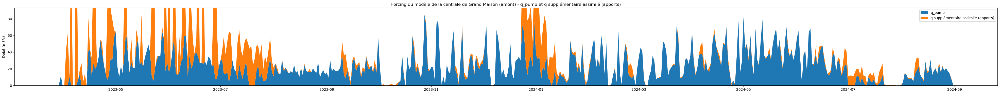

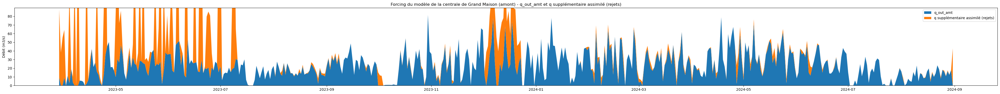

In [29]:
plt.figure(figsize = (50,4))
plt.stackplot(forcing["q_pump"].resample('D').mean().index,[list((forcing["q_pump"]).resample('D').mean()),
                    np.maximum(pd.Series((np.array(results["V_mean_smoothed"]["V_mean_smoothed_amt"])[1:] - np.array(results["V_mean_smoothed"]["V_mean_smoothed_amt"])[:-1])/3600,
                   index = results["V_mean_smoothed"].index[1:]).resample('1D').mean() - (forcing["q_pump"] - forcing["q_out_amt"]).resample('D').mean(), 0)])
plt.ylim(0, forcing["q_pump"].resample('D').mean().max() * 1.1)
plt.legend(["q_pump", "q supplémentaire assimilé (apports)"])
plt.title("Forcing du modèle de la centrale de Grand Maison (amont) - q_pump et q supplémentaire assimilé (apports)")
plt.ylabel("Débit (m3/s)")

plt.figure(figsize = (50,4))
plt.stackplot(forcing["q_out_amt"].resample('D').mean().index,[list((forcing["q_out_amt"]).resample('D').mean()),
                    np.maximum(-pd.Series((np.array(results["V_mean_smoothed"]["V_mean_smoothed_amt"])[1:] - np.array(results["V_mean_smoothed"]["V_mean_smoothed_amt"])[:-1])/3600,
                   index = results["V_mean_smoothed"].index[1:]).resample('1D').mean() + (forcing["q_pump"] - forcing["q_out_amt"]).resample('D').mean(), 0)])
plt.ylim(0, forcing["q_out_amt"].resample('D').mean().max() * 1.1)
plt.legend(["q_out_amt", "q supplémentaire assimilé (rejets)"])
plt.title("Forcing du modèle de la centrale de Grand Maison (amont) - q_out_amt et q supplémentaire assimilé (rejets)")
plt.ylabel("Débit (m3/s)")

Text(0, 0.5, 'Débit (m3/s)')

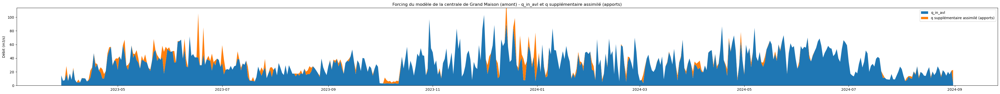

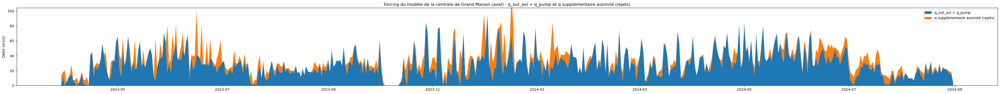

In [30]:
plt.figure(figsize = (50,4))
plt.stackplot(forcing["q_pump"].resample('D').mean().index,[list((forcing["q_in_avl"]).resample('D').mean()),
                    np.maximum(pd.Series((np.array(results["V_mean_smoothed"]["V_mean_smoothed_avl"])[1:] - np.array(results["V_mean_smoothed"]["V_mean_smoothed_avl"])[:-1])/3600,
                   index = results["V_mean_smoothed"].index[1:]).resample('1D').mean() - (forcing["q_in_avl"] - forcing["q_pump"] - forcing["q_out_avl"]).resample('D').mean(), 0)])
plt.ylim(0, forcing["q_in_avl"].resample('D').mean().max() * 1.1)
plt.legend(["q_in_avl", "q supplémentaire assimilé (apports)"])
plt.title("Forcing du modèle de la centrale de Grand Maison (amont) - q_in_avl et q supplémentaire assimilé (apports)")
plt.ylabel("Débit (m3/s)")

plt.figure(figsize = (50,4))
plt.stackplot(forcing["q_out_avl"].resample('D').mean().index,[list((forcing["q_out_avl"] + forcing["q_pump"]).resample('D').mean()),
                    np.maximum(-pd.Series((np.array(results["V_mean_smoothed"]["V_mean_smoothed_avl"])[1:] - np.array(results["V_mean_smoothed"]["V_mean_smoothed_avl"])[:-1])/3600,
                   index = results["V_mean_smoothed"].index[1:]).resample('1D').mean() + (forcing["q_in_avl"] - forcing["q_pump"] - forcing["q_out_avl"]).resample('D').mean(), 0)])

plt.ylim(0, (forcing["q_out_avl"] + forcing["q_pump"]).resample('D').mean().max() * 1.1)
plt.legend(["q_out_avl + q_pump", "q supplémentaire assimilé (rejets)"])
plt.title("Forcing du modèle de la centrale de Grand Maison (aval) - q_out_avl + q_pump et q supplémentaire assimilé (rejets)")
plt.ylabel("Débit (m3/s)")

In [31]:
## comparaison des deux courbes h-s-v

In [32]:
assimilator = simulake.EnKFParamsStep(200, 0.2, 1, 10, 50, 90, 0, 135000000, 0, 14300000)
print(assimilator.__str__())

results_power_law = simulake.run_step_enkf_enks(forcing,r_curve_power_law_amt, r_curve_power_law_avl, assimilator)

EnKFParamsStep(N=200, sigma_obs=0.2, sigma_init=1, sigma_eta_step=10, sigma_eta_app=50, sigma_eta_out=90, Vmin_amt=0, Vmax_amt=135000000, Vmin_avl=0, Vmax_avl=14300000)


(np.float64(19445.0), np.float64(19966.0))

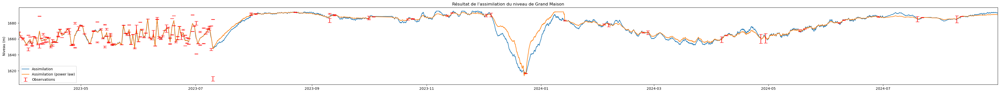

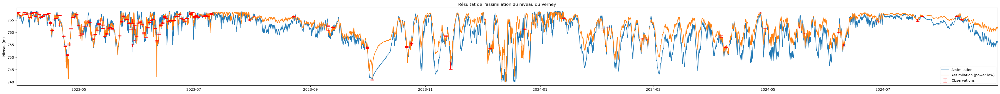

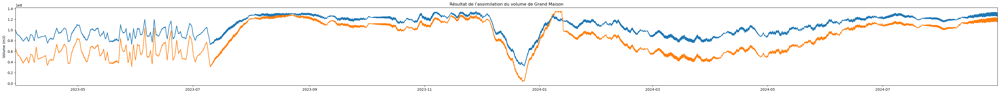

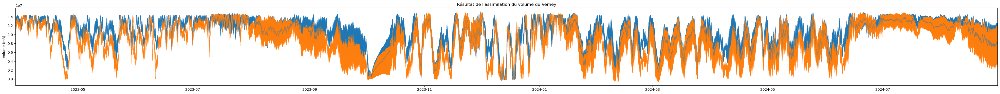

In [33]:
plt.figure(figsize = (50,4))
plt.plot(results["H_mean_smoothed"]['H_mean_smoothed_amt'], label = "Assimilation")
plt.plot(results_power_law["H_mean_smoothed"]['H_mean_smoothed_amt'], label = "Assimilation (power law)")
plt.errorbar(df_GM.index, df_GM['level_GM'], yerr = df_GM['uncert_GM'], color = "red", label = "Observations", ls = "none", capsize = 5)
plt.title("Résultat de l'assimilation du niveau de Grand Maison")
plt.ylabel("Niveau (m)")
plt.xlim(results_power_law["H_mean_smoothed"].index.min(), results_power_law["H_mean_smoothed"].index.max())
plt.legend()

plt.figure(figsize = (50,4))
plt.plot(results["H_mean_smoothed"]['H_mean_smoothed_avl'], label = "Assimilation")
plt.plot(results_power_law["H_mean_smoothed"]['H_mean_smoothed_avl'], label = "Assimilation (power law)")
plt.errorbar(df_V.index, df_V['level_V'], yerr = df_V['uncert_V'], color = "red", label = "Observations", ls = "none", capsize = 5)
plt.title("Résultat de l'assimilation du niveau du Verney")
plt.ylabel("Niveau (m)")
plt.xlim(results_power_law["H_mean_smoothed"].index.min(), results_power_law["H_mean_smoothed"].index.max())
plt.legend()

plt.figure(figsize = (50,4))
plt.errorbar(results["V_mean_smoothed"].index, results["V_mean_smoothed"]['V_mean_smoothed_amt'], results["V_std_smoothed"]['V_std_smoothed_amt'])
plt.errorbar(results_power_law["V_mean_smoothed"].index, results_power_law["V_mean_smoothed"]['V_mean_smoothed_amt'], results_power_law["V_std_smoothed"]['V_std_smoothed_amt'])
plt.title("Résultat de l'assimilation du volume de Grand Maison")
plt.ylabel("Volume (m3)")
plt.xlim(results_power_law["V_mean_smoothed"].index.min(), results_power_law["V_mean_smoothed"].index.max())

plt.figure(figsize = (50,4))
plt.errorbar(results["V_mean_smoothed"].index, results["V_mean_smoothed"]['V_mean_smoothed_avl'], results["V_std_smoothed"]['V_std_smoothed_avl'], alpha = 0.5)
plt.errorbar(results_power_law["V_mean_smoothed"].index, results_power_law["V_mean_smoothed"]['V_mean_smoothed_avl'], results_power_law["V_std_smoothed"]['V_std_smoothed_avl'], alpha = 0.5)
plt.title("Résultat de l'assimilation du volume du Verney")
plt.ylabel("Volume (m3)")
plt.xlim(results_power_law["V_mean_smoothed"].index.min(), results_power_law["V_mean_smoothed"].index.max())

In [34]:
## test de la sensibilité à l'oubli de points de mesures d'altimétrie sur le lac du Chambon

In [35]:
df_C = pd.read_csv('level_Chambon.csv').set_index("date")
df_C.index = pd.to_datetime(df_C.index)
dates = df_C.index[df_C.index > pd.to_datetime('2023-07-30 15:17:04')]

prodCentrales = pd.read_parquet("2010-01-01_2100-01-01_hydro_10min.parquet")

apports = pd.read_csv("debit-des-rivieres-aux-abords-de-centrales-hydrauliques-depuis-2001.csv")
apports = apports[apports["Périmètre spatial"] ==	"Débit naturel journalier de la Romanche à Chambon Amont (220km2) Q0105"].copy()
apports['Date'] = pd.to_datetime(apports['Date'])
apports.index = apports['Date']

assimilator = simulake.EnKFParamsReservoir(200, 0.2, 1, 50, 0, 48000000)
print(assimilator.__str__())

EnKFParamsReservoir(N=200, sigma_obs=0.2, sigma_init=1, sigma_eta=50, Vmin=0, Vmax=48000000)


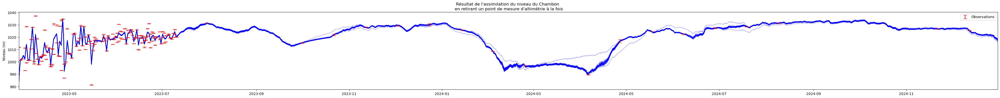

In [36]:
plt.figure(figsize = (50,4))

for d in dates :
    df_C_reduced = df_C.copy().drop(d)
    forcing = simulake.build_reservoir_forcings(df_C_reduced, prodCentrales, apports, "level", "SSGUIH", "Débit", 1/116*45, freq='1h')
    results_power_law = simulake.run_reservoir_enkf_enks(forcing,r_curve_power_law, assimilator)
    plt.plot(results_power_law["H_mean_smoothed"]['H_mean_smoothed'], alpha = 0.3, color = "blue")


plt.errorbar(df_C.index, df_C['level'], yerr = df_C['uncert'], color = "red", label = "Observations", ls = "none", capsize = 5)
plt.xlim(results_power_law["H_mean_smoothed"].index.min(), results_power_law["H_mean_smoothed"].index.max())
plt.title("Résultat de l'assimilation du niveau du Chambon \n en retirant un point de mesure d'altimétrie à la fois")
plt.ylabel("Niveau (m)")
plt.legend()

In [37]:
## test de la sensibilité à l'oubli de points de mesures d'altimétrie sur la step de Grand Maison

In [38]:
df_GM = pd.read_csv('level_Grand_Maison.csv').set_index("date")
df_GM.index = pd.to_datetime(df_GM.index)
df_GM = df_GM.rename(columns = {"level" : "level_GM", "uncert" : "uncert_GM"})
df_V = pd.read_csv('level_Verney.csv').set_index("date")
df_V.index = pd.to_datetime(df_V.index)
df_V = df_V.rename(columns = {"level" : "level_V", "uncert" : "uncert_V"})
df_GM = df_GM.resample('1D').mean()
df_V = df_V.resample('1D').mean()
df_GM.dropna(inplace = True)
df_V.dropna(inplace = True)


# on s'assure que les points sont pas trop proches et que retirer un point a réellement un impact sur l'info disponible
d0 = df_GM.index[0]
for d in df_GM.index[1 :]:
    if d - d0 < pd.Timedelta(days = 5) :
        df_GM.drop(d, inplace = True)
        df_V.drop(d, inplace = True)
    else :
        d0 = d


prodCentrales = pd.read_parquet("2010-01-01_2100-01-01_hydro_10min.parquet")

apports = pd.read_csv("debit-des-rivieres-aux-abords-de-centrales-hydrauliques-depuis-2001.csv")

apports = apports[apports["Périmètre spatial"] ==	"Débit naturel reconstitué journalier de l'Eau d'Olle à la Pernière (172km2) Q0115"].copy()
apports['Date'] = pd.to_datetime(apports['Date'])
apports.index = apports['Date']
apports = apports.rename(columns= {"Débit" : "debit_V"})
apports['debit_GM'] = 0

pump = pd.read_parquet("2010-01-01_2100-01-01_hydro_10min_soutirage.parquet")

assimilator = simulake.EnKFParamsStep(200, 0.2, 1, 10, 50, 90, 0, 135000000, 0, 14300000)
print(assimilator.__str__())

EnKFParamsStep(N=200, sigma_obs=0.2, sigma_init=1, sigma_eta_step=10, sigma_eta_app=50, sigma_eta_out=90, Vmin_amt=0, Vmax_amt=135000000, Vmin_avl=0, Vmax_avl=14300000)


C:\Users\paoliniart\AppData\Local\Temp\ipykernel_22436\314049880.py:8: Pandas4Warning: Sorting by default when concatenating all DatetimeIndex is deprecated.  In the future, pandas will respect the default of `sort=False`. Specify `sort=True` or `sort=False` to silence this message. If you see this warnings when not directly calling concat, report a bug to pandas.
  forcing = simulake.build_step_forcings(pd.concat([df_GM_reduced, df_V_reduced], axis = 1), prodCentrales, pump, apports, "level_GM", "level_V", "G.MAIH", "OZ   H",
C:\Users\paoliniart\AppData\Local\Temp\ipykernel_22436\314049880.py:8: Pandas4Warning: Sorting by default when concatenating all DatetimeIndex is deprecated.  In the future, pandas will respect the default of `sort=False`. Specify `sort=True` or `sort=False` to silence this message. If you see this warnings when not directly calling concat, report a bug to pandas.
  forcing = simulake.build_step_forcings(pd.concat([df_GM_reduced, df_V_reduced], axis = 1), prodCen

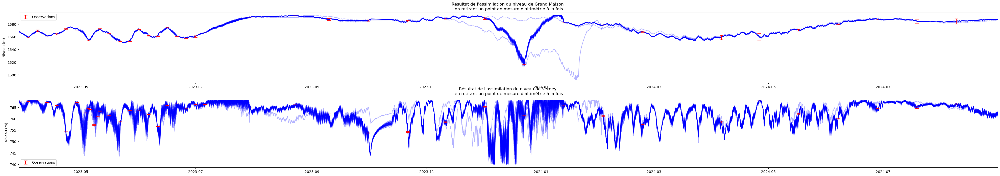

In [39]:
fig, ax = plt.subplots(2, 1, figsize = (50, 8))
dates = df_GM.index[df_GM.index > pd.to_datetime('2023-07-30 15:17:04')]


for d in dates :
    df_GM_reduced = df_GM.copy().drop(d)
    df_V_reduced = df_V.copy().drop(d)
    forcing = simulake.build_step_forcings(pd.concat([df_GM_reduced, df_V_reduced], axis = 1), prodCentrales, pump, apports, "level_GM", "level_V", "G.MAIH", "OZ   H",
                                       "G.MAIHP", "debit_GM", "debit_V", 1/1690*216, 1/12.2*32, 1/1280*128, freq='1h')
    results_power_law = simulake.run_step_enkf_enks(forcing,r_curve_power_law_amt, r_curve_power_law_avl, assimilator)
    ax[0].plot(results_power_law["H_mean_smoothed"]['H_mean_smoothed_amt'], alpha = 0.3, color = "blue")
    ax[1].plot(results_power_law["H_mean_smoothed"]['H_mean_smoothed_avl'], alpha = 0.3, color = "blue")


ax[0].errorbar(df_GM.index, df_GM['level_GM'], yerr = df_GM['uncert_GM'], color = "red", label = "Observations", ls = "none", capsize = 5)
ax[1].errorbar(df_V.index, df_V['level_V'], yerr = df_V['uncert_V'], color = "red", label = "Observations", ls = "none", capsize = 5)
ax[0].set_xlim(results_power_law["H_mean_smoothed"].index.min(), results_power_law["H_mean_smoothed"].index.max())
ax[1].set_xlim(results_power_law["H_mean_smoothed"].index.min(), results_power_law["H_mean_smoothed"].index.max())
ax[0].set_title("Résultat de l'assimilation du niveau de Grand Maison \n en retirant un point de mesure d'altimétrie à la fois")
ax[1].set_title("Résultat de l'assimilation du niveau de Verney \n en retirant un point de mesure d'altimétrie à la fois")
ax[0].set_ylabel("Niveau (m)")
ax[1].set_ylabel("Niveau (m)")
ax[0].legend()
ax[1].legend()

In [108]:
## lac de Serre Ponçon (et comparaison avec les mesures disponibles sur Serre Poncon)

In [109]:
df_SP = pd.read_csv('level_Serre_Poncon.csv').set_index("date")
df_SP.index = pd.to_datetime(df_SP.index)

prodCentrales = pd.read_parquet("2010-01-01_2100-01-01_hydro_10min.parquet")

apports = pd.read_csv("debit-des-rivieres-aux-abords-de-centrales-hydrauliques-depuis-2001.csv")
apports = apports[apports["Périmètre spatial"] ==	'Centrale de Serre Ponçon, apports naturels reconstitués journaliers (3580km2) Q0164'].copy()
apports['Date'] = pd.to_datetime(apports['Date'])
apports.index = apports['Date']

In [ ]:
forcing = simulake.build_reservoir_forcings(df_SP, prodCentrales, apports, "level", "S.PONH", "Débit", 1/370*375, freq='1h')

In [111]:
## courbe h-s-V en loi de puissance

h_list = np.arange(725, 780, 1)

a_coeff = 29000000 / (780 - 725)**1.42
b_coeff = 1270000000 / (780 - 725)**2.42
s_list, v_list = h_s_v_power_law(h_list - 725, a_coeff, b_coeff)

pd.DataFrame({
    "h": h_list,
    "s": s_list,
    "v": v_list
}).to_csv("rating_curve_Serre_Poncon_power_law.csv", index=False)

r_curve_power_law = simulake.RatingCurve.from_csv("rating_curve_Serre_Poncon_power_law.csv", "h", "s", "v")

In [112]:
assimilator = simulake.EnKFParamsReservoir(200, 0.2, 1, 750, 0, 1270000000)
print(assimilator.__str__())

results = simulake.run_reservoir_enkf_enks(forcing,r_curve_power_law, assimilator)

EnKFParamsReservoir(N=200, sigma_obs=0.2, sigma_init=1, sigma_eta=750, Vmin=0, Vmax=1270000000)


In [117]:
mesures_level = pd.read_csv("alti_Serre_Poncon_In_Situ.csv", delimiter = ";").set_index("date")
mesures_level.index = pd.to_datetime(mesures_level.index, format = "%d/%m/%Y")

mesures_volume = []
for h in mesures_level["niveau "].values :
    v = b_coeff * (h - 725)**2.42
    mesures_volume.append(v)
mesures_volume = pd.Series(mesures_volume, index = mesures_level.index)

Text(0, 0.5, 'Débit (m3/s)')

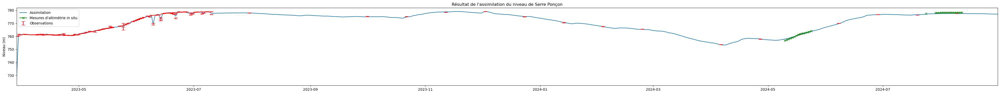

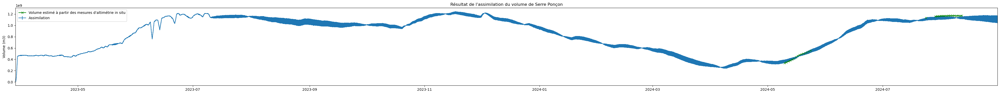

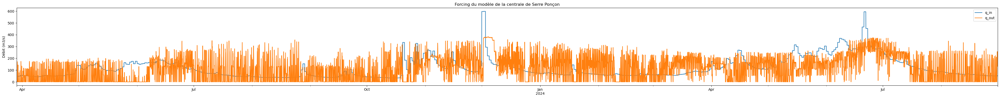

In [124]:
plt.figure(figsize = (50,4))
plt.plot(results["H_mean_smoothed"]['H_mean_smoothed'], label = "Assimilation")
plt.errorbar(df_SP.index, df_SP['level'], yerr = df_SP['uncert'], color = "red", label = "Observations", ls = "none", capsize = 5)
plt.plot(mesures_level.index, mesures_level['niveau '], label = "Mesures d'altimétrie in situ", color = "green", marker = "x")
plt.title("Résultat de l'assimilation du niveau de Serre Ponçon")
plt.ylabel("Niveau (m)")
plt.xlim(results["H_mean_smoothed"].index.min(), results["H_mean_smoothed"].index.max())
plt.legend()

plt.figure(figsize = (50,4))
plt.errorbar(results["V_mean_smoothed"].index, results["V_mean_smoothed"]['V_mean_smoothed'], results["V_std_smoothed"]['V_std_smoothed'], label = "Assimilation")
plt.plot(mesures_volume.index, mesures_volume.values, label = "Volume estimé à partir des mesures d'altimétrie in situ", color = "green", marker = "x")
plt.title("Résultat de l'assimilation du volume de Serre Ponçon")
plt.legend()
plt.ylabel("Volume (m3)")
plt.xlim(results["V_mean_smoothed"].index.min(), results["V_mean_smoothed"].index.max())

plt.figure(figsize = (50,4))
forcing['q_in'].plot()
forcing['q_out'].plot()
plt.legend()
plt.title("Forcing du modèle de la centrale de Serre Ponçon")
plt.ylabel("Débit (m3/s)")

In [52]:
## test sur le lac Leman

In [53]:
flow_in = pd.read_csv("C:/Users/paoliniart/Documents/leman/2009_flow_2023-01-01_2026-04-13.csv", encoding="latin1", skiprows = 8, delimiter = ";").set_index("Zeitstempel")
flow_in.index = pd.to_datetime(flow_in.index, format = "%Y-%m-%d %H:%M:%S")
flow_in.rename(columns = {"Wert" : "flow_in"}, inplace = True)
flow_out = pd.read_csv("C:/Users/paoliniart/Documents/leman/2606_flow_2023-01-01_2026-04-13.csv", encoding="latin1", skiprows = 8, delimiter = ";").set_index("Zeitstempel")
flow_out.index = pd.to_datetime(flow_out.index, format = "%Y-%m-%d %H:%M:%S")
flow_out.rename(columns = {"Wert" : "flow_out"}, inplace = True)
level = pd.read_csv("C:/Users/paoliniart/Documents/leman/2028_level_2023-01-01_2026-04-15.csv", encoding="latin1", skiprows = 8, delimiter = ";").set_index("Zeitstempel")
level.index = pd.to_datetime(level.index, format = "%Y-%m-%d %H:%M:%S")
level.index = level.index.tz_localize('UTC')
level_downsampled = pd.concat([level[:2:].copy(), level[2::21*24].copy()], axis = 0)
level_downsampled["Wert"] = level_downsampled["Wert"].values + np.random.normal(0, 0.02, len(level_downsampled))

In [54]:
forcing = simulake.build_reservoir_forcings(level_downsampled, flow_out, flow_in, "Wert", "flow_out", "flow_in", 1, freq='1h')

<Axes: >

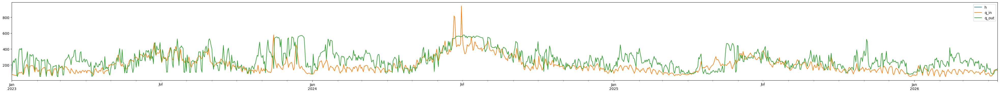

In [55]:
forcing.resample('1D').mean().plot(figsize = (50,4))

In [41]:
## courbe h-s-V en loi de puissance

h_list = np.arange(63.2, 373, 0.1)

a_coeff = 5.8e8 / (373 - 63.2)**1.42
b_coeff = 8.9e10 / (373 - 63.2)**2.42
s_list, v_list = h_s_v_power_law(h_list - 63.2, a_coeff, b_coeff)

pd.DataFrame({
    "h": h_list,
    "s": s_list,
    "v": v_list
}).to_csv("rating_curve_Leman_power_law.csv", index=False)

r_curve_power_law = simulake.RatingCurve.from_csv("rating_curve_Leman_power_law.csv", "h", "s", "v")

In [42]:
assimilator = simulake.EnKFParamsReservoir(200, 0.02, 1, 15, 0, 8.9e10)
print(assimilator.__str__())

results = simulake.run_reservoir_enkf_enks(forcing,r_curve_power_law, assimilator)

EnKFParamsReservoir(N=200, sigma_obs=0.02, sigma_init=1, sigma_eta=15, Vmin=0, Vmax=89000000000.0)


In [43]:
mesures_volume = []
for h in level["Wert"].values :
    v = b_coeff * (h - 63.2)**2.42
    mesures_volume.append(v)
mesures_volume = pd.Series(mesures_volume, index = level.index)

Text(0, 0.5, 'h (m3)')

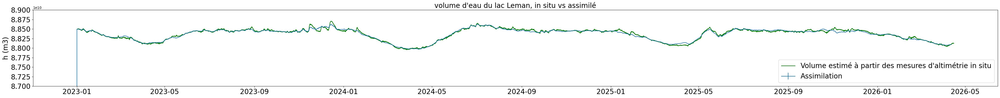

In [ ]:
## encore quelques problemes dans l'assimilation qui font le saut au départ

plt.figure(figsize = (50,4))
plt.errorbar(results["V_mean_smoothed"].index[1:], results["V_mean_smoothed"]['V_mean_smoothed'][1:], results["V_std_smoothed"]['V_std_smoothed'][1:], label = "Assimilation")
plt.plot(mesures_volume.index, mesures_volume.values, label = "Volume estimé à partir des mesures d'altimétrie in situ", color = "green")
plt.ylim(8.7e10, 8.9e10)
plt.legend(fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title("volume d'eau du lac Leman, in situ vs assimilé", fontsize = 20)
plt.ylabel("h (m3)", fontsize = 20)

Text(0, 0.5, 'h (m)')

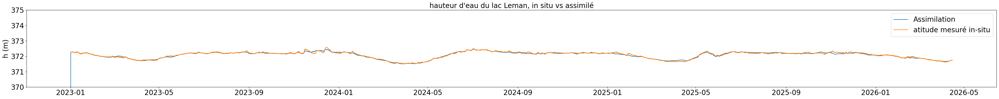

In [45]:
plt.figure(figsize = (50,4))
plt.plot(results["H_mean_smoothed"]['H_mean_smoothed'][1:], label = "Assimilation")
plt.plot(level.index, level["Wert"], label = "atitude mesuré in-situ")
plt.ylim(370, 375)
plt.legend(fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title("hauteur d'eau du lac Leman, in situ vs assimilé", fontsize = 20)
plt.ylabel("h (m)", fontsize = 20)

In [20]:
def NSE(mesure, modele) :
    id = mesure.index.intersection(modele.index)
    mesure = mesure.loc[id]
    modele = modele.loc[id]
    return 1 - ((np.sum((mesure - modele)**2)/np.sum((mesure - mesure.mean())**2)))

In [ ]:
print("NSE assimilation : " + str(NSE(level["Wert"][21*24:], results["H_mean_smoothed"]['H_mean_smoothed'][21*24+1:])))

NSE assimilation : 0.9710608804690362


In [48]:
forcing21 = forcing['h'].dropna()
forcing_interp = forcing21.reindex(forcing.index).interpolate(method = "time")

In [49]:
print("NSE interpolation lineaire : " + str(NSE(level["Wert"], forcing_interp)))

NSE interpolation lineaire : 0.9582754311914109


Text(0, 0.5, 'h (m)')

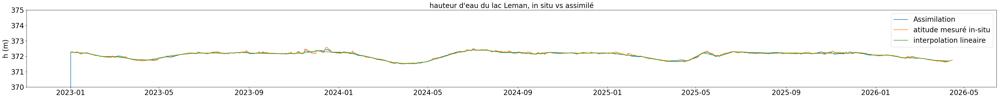

In [50]:
plt.figure(figsize = (50,4))
plt.plot(results["H_mean_smoothed"]['H_mean_smoothed'][1:], label = "Assimilation")
plt.plot(level.index, level["Wert"], label = "atitude mesuré in-situ")
plt.plot(forcing_interp, label = "interpolation lineaire")
plt.ylim(370, 375)
plt.legend(fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title("hauteur d'eau du lac Leman, in situ vs assimilé", fontsize = 20)
plt.ylabel("h (m)", fontsize = 20)

In [71]:
## meme chose sur le lac powell (USA) car plus grosses variations de volume

In [189]:
flow_in = pd.read_csv("C:/Users/paoliniart/Documents/powell/powell_inflow.csv").set_index("datetime")
flow_in.index = pd.to_datetime(flow_in.index)
flow_in.rename(columns = {"inflow" : "flow_in"}, inplace = True)
flow_in["flow_in"] = flow_in["flow_in"].values
flow_out = pd.read_csv("C:/Users/paoliniart/Documents/powell/powell_release.csv").set_index("datetime")
flow_out.index = pd.to_datetime(flow_out.index)
flow_out.rename(columns = {"power release" : "flow_out"}, inplace = True)
level = pd.read_csv("C:/Users/paoliniart/Documents/powell/powell_elevation.csv").set_index("datetime")
level.index = pd.to_datetime(level.index)
level.index = level.index.tz_localize('UTC')
level_downsampled = level[::5 * 365].copy()
level_downsampled["pool elevation"] = level_downsampled["pool elevation"].values + np.random.normal(0, 0.02, len(level_downsampled))

In [190]:
forcing = simulake.build_reservoir_forcings(level_downsampled, flow_out, flow_in, "pool elevation", "flow_out", "flow_in", 1, freq='1d')

<Axes: xlabel='datetime'>

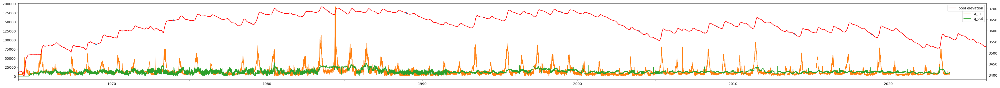

In [191]:
fig, ax = plt.subplots(figsize = (50,4))

forcing.plot(ax = ax)
ax1 = ax.twinx()
forcing["h"].plot(ax = ax1, marker =".")
level.plot(ax = ax1, color = 'red')


In [192]:
## courbe h-s-V en loi de puissance

h_list = np.arange(3370, 3700, 1)

a_coeff = 7.03e9 / 340**1.42
b_coeff = 1.06e12 / 340**2.42
s_list, v_list = h_s_v_power_law(h_list - 3370, a_coeff, b_coeff)

pd.DataFrame({
    "h": h_list,
    "s": s_list,
    "v": v_list
}).to_csv("rating_curve_powell_power_law.csv", index=False)

r_curve_power_law = simulake.RatingCurve.from_csv("rating_curve_powell_power_law.csv", "h", "s", "v")

In [193]:
assimilator = simulake.EnKFParamsReservoir(200, 0.02, 1, 1500, 0, 1.06e14)
print(assimilator.__str__())

results = simulake.run_reservoir_enkf_enks(forcing,r_curve_power_law, assimilator)

EnKFParamsReservoir(N=200, sigma_obs=0.02, sigma_init=1, sigma_eta=1500, Vmin=0, Vmax=106000000000000.0)


Text(0, 0.5, 'altimétrie du lac (en ft)')

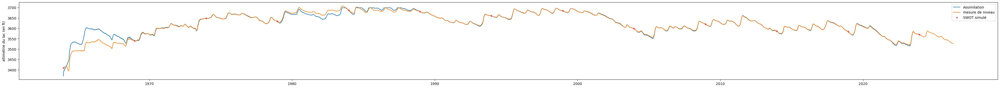

In [194]:
plt.figure(figsize = (50,4))
plt.plot(results["H_mean_smoothed"]['H_mean_smoothed'], label = "Assimilation")
plt.plot(level.index, level, label = "mesure de niveau")
plt.plot(level_downsampled.index, level_downsampled, 'r+', label = "SWOT simulé")
plt.legend()
plt.ylabel("altimétrie du lac (en ft)")

In [126]:
print("NSE assimilation : " + str(NSE(level, results["H_mean_smoothed"]['H_mean_smoothed'])))

NSE assimilation : 1.0
